# Store Sales - Time Series Forecasting
### Use machine learning to predict grocery sales

#### Goal of the Competition
In this “getting started” competition, you’ll use time-series forecasting to forecast store sales on data from Corporación Favorita, a large Ecuadorian-based grocery retailer.

Specifically, you'll build a model that more accurately predicts the unit sales for thousands of items sold at different Favorita stores. You'll practice your machine learning skills with an approachable training dataset of dates, store, and item information, promotions, and unit sales.

#### Context
Forecasts aren’t just for meteorologists. Governments forecast economic growth. Scientists attempt to predict the future population. And businesses forecast product demand—a common task of professional data scientists. Forecasts are especially relevant to brick-and-mortar grocery stores, which must dance delicately with how much inventory to buy. Predict a little over, and grocers are stuck with overstocked, perishable goods. Guess a little under, and popular items quickly sell out, leading to lost revenue and upset customers. More accurate forecasting, thanks to machine learning, could help ensure retailers please customers by having just enough of the right products at the right time.

Current subjective forecasting methods for retail have little data to back them up and are unlikely to be automated. The problem becomes even more complex as retailers add new locations with unique needs, new products, ever-transitioning seasonal tastes, and unpredictable product marketing.

#### Potential Impact
If successful, you'll have flexed some new skills in a real world example. For grocery stores, more accurate forecasting can decrease food waste related to overstocking and improve customer satisfaction. The results of this ongoing competition, over time, might even ensure your local store has exactly what you need the next time you shop.

Primero, vamos a tomar las librerías que necesitamos para resolver todo el reto.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

#import other libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Import regression and statmodels libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_log_error
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Sirven para obtener el error de predicción de forest
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_squared_log_error as msle

#pandas dataframe configuration
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.4f}'.format

/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/transactions.csv


Ahora, establecemos la ruta donde la VM de Kaggle tiene almacenada la información de los datasets.

In [2]:
DATA_PATH = '../input/store-sales-time-series-forecasting/'

Ahora, leemos los datos de cada dataset a una variable utilizando Pandas.
En algunas ocasiones se leerá y se convertirán u ordenarán los datos en una sola línea.

In [3]:
# Mandamos a llamar nuestros datasets a las siguentes variables.
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train.csv'))
df_test = pd.read_csv(os.path.join(DATA_PATH, 'test.csv'))
df_stores = pd.read_csv(os.path.join(DATA_PATH, 'stores.csv'))
# Llamamos y acomodamos a estos datos de forma cronológica
df_transactions = pd.read_csv(os.path.join(DATA_PATH, 'transactions.csv')).sort_values(['store_nbr', 'date'])
df_oil = pd.read_csv(os.path.join(DATA_PATH, 'oil.csv'))
df_holidays = pd.read_csv(os.path.join(DATA_PATH, 'holidays_events.csv'))

Convertimos las fechas a un formato compatible para Pandas.

In [4]:
# Transformamos la fecha incompatible a fecha compatible con la librería pandas.
df_train["date"] = pd.to_datetime(df_train['date'])
df_test["date"] = pd.to_datetime(df_test['date'])
df_transactions["date"] = pd.to_datetime(df_transactions['date'])
df_holidays["date"] = pd.to_datetime(df_holidays['date'])
df_oil["date"] = pd.to_datetime(df_oil['date'])

Antes de algún análisis, resolvemos un conflicto entre las columnas de los datasets antes de realizar algún merge.

In [5]:
# Primero cambiamos dos nombres de dos columnas que 'chocan'
# al intentar hacer un merge, una columna pertenece a las
# vacaciones y la otra columna al tipo de tienda.
df_holidays = df_holidays.rename(columns = {'type': 'holiday_type'})
df_stores = df_stores.rename(columns = {'type': 'store_type'})

In [6]:
# Checamos que se hayan renombrado bien
# df_holidays.head()
# df_stores.head()

Asiganmos tipos de dato fijos a los datasets

In [7]:
# Asignamos la lectura de los datos como un float y un int a la variable correspondiente.
df_train.sales = df_train.sales.astype('float32')
df_stores.cluster = df_stores.cluster.astype('int8')

In [8]:
# Establecemos el tipo de fecha fijo en el dataset de train
type(df_train['date'][0])

pandas._libs.tslibs.timestamps.Timestamp

# EDA

Los datos de cada archivo tienen filas y columnas representativas de productos, directamente los datos de las ventas no están y es por eso que tenemos que obtenerlos por nuestra cuenta al momento de juntar los datasets de manera adecuada.

Primero analizaremos lo que tiene cada dataset...

In [9]:
# Mostrar dataset de train
df_train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0
1,1,2013-01-01,1,BABY CARE,0.0000,0
2,2,2013-01-01,1,BEAUTY,0.0000,0
3,3,2013-01-01,1,BEVERAGES,0.0000,0
4,4,2013-01-01,1,BOOKS,0.0000,0


In [10]:
# Mostrar dataset de pruebas
df_test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [11]:
# Mostrar dataset de tiendas
df_stores.head()

,store_nbr,city,state,store_type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [12]:
# Mostrar dataset de transacciones
df_transactions.head()

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520


In [13]:
# Mostrar dataset de petróleo
df_oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.1400
2,2013-01-03,92.9700
3,2013-01-04,93.1200
4,2013-01-07,93.2000


In [14]:
# Mostrar dataset de vacaciones
df_holidays.head()

,date,holiday_type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


## EDA básico de cada dataset:

Revisaremos la correlación del dataset de train con las demás, así podremos ver las relaciones y tomar en cuenta ciertos datos para nuestro dataframe final.

#### Ventas

Vamos a tomar primero el promedio de las ventas, luego vamos a juntar los datos para realizar un análisis para revisar alguna especie de relación en ventas con transacciones

In [15]:
df_train_eda = df_train.groupby(['date', 'store_nbr']).sales.mean().reset_index()

In [16]:
df_train_aux = pd.merge(df_train_eda, df_transactions, how = 'left')

Con un rango de fechas y el promedio de transacciones, obtenemos lo que vamos a graficar

In [17]:
df_train_sactions = df_train_aux.groupby(df_train.date)['transactions'].mean().reset_index()
df_newdates = df_train.groupby(df_train.date)['sales'].mean().reset_index()

Ahora realizamos una transformación de datos para que podamos graficarlos

In [18]:
df_newdates_aux = df_transactions.groupby(df_transactions.date)['transactions'].mean().reset_index()
daily_total_sales = df_newdates.copy()
daily_total_sales = daily_total_sales.set_index(pd.to_datetime(daily_total_sales['date']))
daily_total_sales = daily_total_sales.resample('1D').mean()

Podemos observar en el gráfico que entre transacciones tenemos picos de ventas, puede indicarnos que existe alguna correlación.

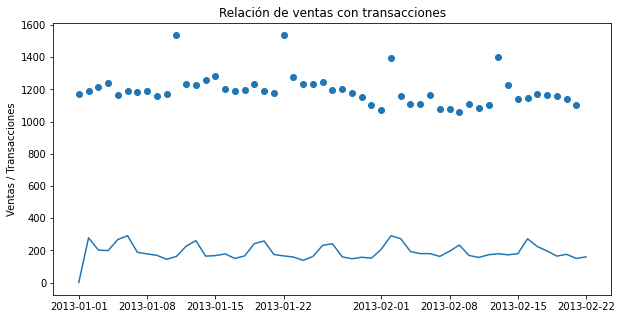

In [19]:
plt.subplots(figsize=(10,5))
plt.scatter(df_train_sactions['date'], df_train_sactions['transactions']-500)
plt.plot(daily_total_sales.loc['2013-01-01':'2013-02-22'])
plt.title("Relación de ventas con transacciones")
plt.ylabel('Ventas / Transacciones')
plt.show()

Si obtenemos la correlación podemos ver que sí hay relación entre ventas y transacciones.

In [20]:
df_train_aux.corr()

,store_nbr,sales,transactions
store_nbr,1.0000,0.1509,0.1893
sales,0.1509,1.0000,0.8374
transactions,0.1893,0.8374,1.0000


#### Vacaciones

Para obtener la relación de ventas con vacaciones, tenemos que relacionarlas entre sí, para ello vamos a tener que quitar unas columnas que no nos sirven o dan información irrelevante. De ahí, podemos obtener las fechas y transformar las ventas en promedios.

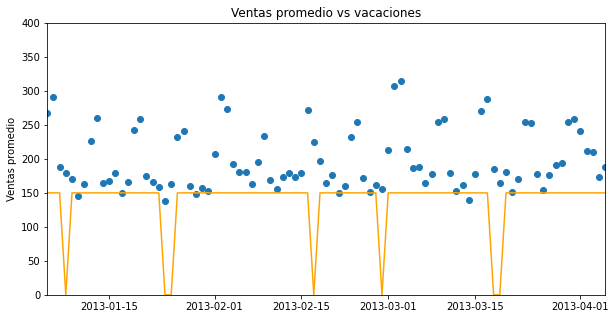

In [21]:
# Obtenemos el promedio de ventas
avg_sales = df_train.groupby(df_train.date)['sales'].mean().reset_index()
# Quitamos las columnas que no nos sirven por ahora
df_holidays_sales = df_holidays.drop(columns = ["locale_name", "description", "holiday_type"])

# Seleccionamos las ventas regionales ya que son las que menos hay y las quitamos
df_holidays_aux=df_holidays_sales.loc[(df_holidays_sales["locale"] == 'Regional')].index
df_holidays_sales=df_holidays_sales.drop(df_holidays_aux)

# Ahora remplazamos las ventas locales y nacionales a 1 para interpretar los datos
df_holidays_sales = df_holidays_sales.replace(['Local', 'National'], 1)

# Locale es nuestra variable que nos indica si hay vacaciones en ese día
avg_sales['locale'] = df_holidays_sales['locale']

# Como tenemos datos faltantes, vamos a rellenar con cero asumiendo
# que nunca hubo vacaciones en ese día.
avg_sales['locale'] = avg_sales['locale'].fillna(0)

# Graficamos los datos con el valor de las vacaciones exagerados para
# ver la relación de forma visual
plt.subplots(figsize=(10,5))
plt.scatter(avg_sales['date'], avg_sales['sales'])
plt.plot(avg_sales['date'], avg_sales["locale"]*150, color = 'orange')
plt.xlim((15710), (15800))
plt.ylim(0,400)
plt.title("Ventas promedio vs vacaciones")
plt.ylabel("Ventas promedio")
plt.show()

Como podemos observar, cada vez que hay vacaciones, el promedio en ventas tiene a bajar un poco, pero después existe un incremento respecto al día anterior del día de vacaciones.

In [22]:
avg_sales.corr()

,sales,locale
sales,1.0000,-0.5435
locale,-0.5435,1.0000


En la correlación podemos ver que tenemos una correlación de magnitud media, lo cual nos indica que sí afecta de cierta manera el que existan vacaciones durante los periodos de ventas, esto también se puede considerar para el dataframe del modelo

#### Promociones

Ahora, para promociones vamos a revisar qué relación tiene con las ventas, si entre más promociones existen más ventas o menos y si significa que aumentan las ventas progresivamente si se acostumbra a tener promociones vigentes.

In [23]:
# Obtenemos el promedio de onpromotion y los ordenamos por fechas.
average_onpromotion = df_train.groupby('date').mean()['onpromotion']

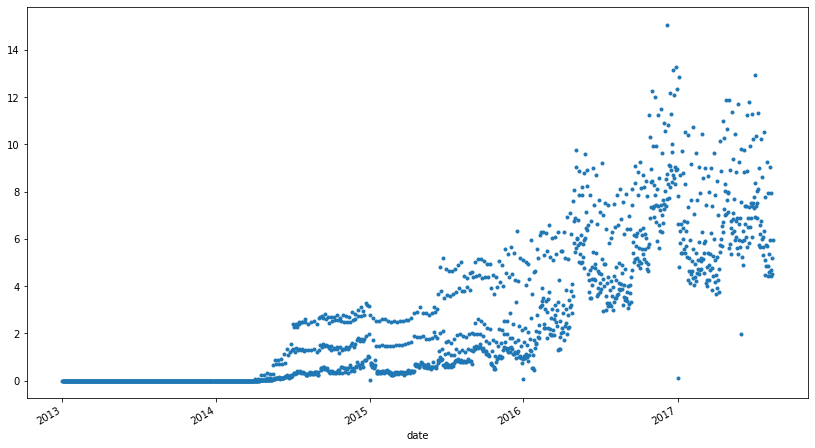

In [24]:
# Graficamos el promedio de los onpromotion.
average_onpromotion.plot(style='.', figsize=(14,8))
plt.show()

In [25]:
# Realizamos una copia de la variable avarage_onpromotion utilizada anteriormente.
avg_train = average_onpromotion.copy()

# Obtenemos la linea de tendencia de los datos.
moving_avg = avg_train.rolling(window=365, center=True, min_periods=183).mean()

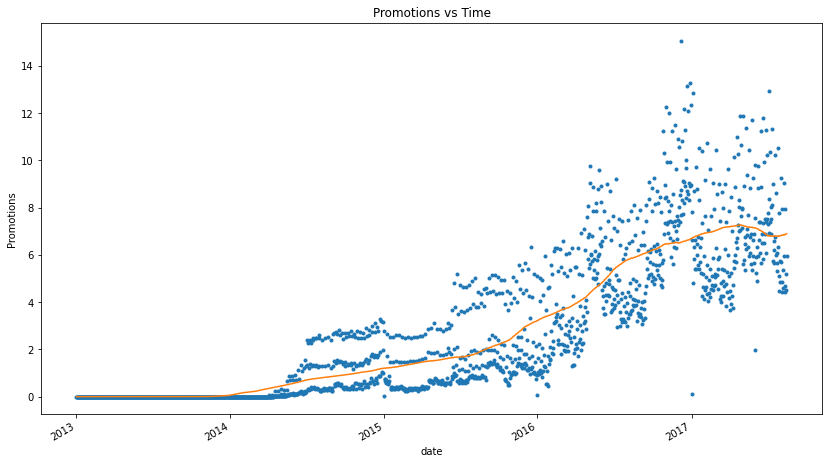

In [26]:
# Graficamos el promedio de los onpromotion obtenidos anteriormente y la linea de tendencia.
avg_train.plot(style='.', figsize=(14,8));
moving_avg.plot()
plt.ylabel("Promotions")
plt.title("Promotions vs Time")
plt.show()

In [27]:
# Realizamos una copia para agrupar los datasets de train y sales.
df_train_temp = df_train.groupby(['store_nbr', 'onpromotion', 'date']).sales.sum().reset_index()

# Creamos una nueva variable para juntar los datasets.
df_aux_merged = pd.merge(df_train_temp, df_stores, how='left')

# Revisamos que los datos se juntaran correctamente.
df_aux_merged

,store_nbr,onpromotion,date,sales,city,state,store_type,cluster
0,1,0,2013-01-01,0.0000,Quito,Pichincha,D,13
1,1,0,2013-01-02,7417.1479,Quito,Pichincha,D,13
2,1,0,2013-01-03,5873.2441,Quito,Pichincha,D,13
3,1,0,2013-01-04,5919.8789,Quito,Pichincha,D,13
4,1,0,2013-01-05,6318.7852,Quito,Pichincha,D,13
...,...,...,...,...,...,...,...,...
499877,54,528,2016-05-21,3424.0000,El Carmen,Manabi,C,3
499878,54,536,2016-05-22,4723.0000,El Carmen,Manabi,C,3
499879,54,543,2016-05-29,4710.0000,El Carmen,Manabi,C,3
499880,54,547,2016-05-15,5608.0000,El Carmen,Manabi,C,3


In [28]:
# Obtenemos las correlaciones de pearson y de spearman.
pearson_corr = df_aux_merged.corr('pearson')['sales'].loc['cluster']
spearman_corr = df_aux_merged.corr('spearman')['sales'].loc['cluster']

In [29]:
# Imprimimos el resultado de las correlaciones de pearson y spearman.
print(f'pearson_corr = {pearson_corr:.4f} and spearman corr = {spearman_corr:.4f}')

pearson_corr = 0.0775 and spearman corr = 0.0682


In [30]:
# Ordenamos los datos por cluster y fecha.
df_sorted_stores = df_aux_merged.sort_values(['cluster', 'date'])

In [31]:
# Graficamos los datos acamodados anteriormente.
px.line(df_sorted_stores, x='date', y='onpromotion', color='cluster', title='Onpromotion by date and cluster')

In [32]:
# Creamos una copia del dataframe y los agrupamos los datos por año y mes.
aux_a = df_aux_merged.copy()
aux_a['year'] = aux_a.date.dt.year
aux_a['month'] = aux_a['date'].dt.month

In [33]:
# Graficamos los datos agrupados por mes.
px.box(aux_a, x='year', y='onpromotion', color='month', title='Box plot onpromotion')

In [34]:
# Se establece la columna de fechas como indice.
# Se separa en meses.
# Obtenemos el promedio y restablecemos el indice original.
aux_a = df_aux_merged.set_index('date').resample('M').onpromotion.mean().reset_index()

# Dentro del dataframe creamos una nueva columna llamada year y solo obtenemos el año.
aux_a['year'] = aux_a.date.dt.year

In [35]:
# Graficamos las onpromotion de cada mes.
px.line(aux_a, x='date', y='onpromotion', color='year', title='Monthly onpromotion')

## ETL

In [36]:
# Juntamos los dataframe de test y stores.
df_test_merged = pd.merge(df_test, df_stores, how = 'left', on = 'store_nbr')
df_test_merged = pd.merge(df_test_merged, df_holidays, how = 'left')
df_test_merged = pd.merge(df_test_merged, df_transactions, how = 'left')
df_test_merged = pd.merge(df_test_merged, df_oil, how = 'left')
df_test_merged.columns

Index(['id', 'date', 'store_nbr', 'family', 'onpromotion', 'city', 'state',
       'store_type', 'cluster', 'holiday_type', 'locale', 'locale_name',
       'description', 'transferred', 'transactions', 'dcoilwtico'],
      dtype='object')

In [37]:
# Juntamos los dataframe de train y stores.
df_train_merged = pd.merge(df_train, df_stores, how = 'left', on = 'store_nbr')
df_train_merged = pd.merge(df_train_merged, df_holidays, how = 'left')
df_train_merged = pd.merge(df_train_merged, df_transactions, how = 'left')
df_train_merged = pd.merge(df_train_merged, df_transactions, how = 'left')
df_train_merged.columns

Index(['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion', 'city',
       'state', 'store_type', 'cluster', 'holiday_type', 'locale',
       'locale_name', 'description', 'transferred', 'transactions'],
      dtype='object')

In [38]:
# Consideramos que necesitamos variables categóricas para lograr una
# mejor clasificación de los datos y obtener lo que queremos probar en train.
df_train_merged['locale_name'] = pd.Categorical(df_train_merged.locale_name)
df_train_merged['description'] = pd.Categorical(df_train_merged.description)

In [39]:
# Revisamos ahora si tenemos datos nulos, en caso de que sí vamos
# a ver de qué forma pueden interpretarse y si tenemos columnas que
# no nos puedan servir para el análisis...

# Revisamos si existe algun dato no numérico en la variable de df_test_merged.
df_test_merged.isna().sum()

id                  0
date                0
store_nbr           0
family              0
onpromotion         0
city                0
state               0
store_type          0
cluster             0
holiday_type    26730
locale          26730
locale_name     26730
description     26730
transferred     26730
transactions    28512
dcoilwtico       7128
dtype: int64

In [40]:
# Contamos los datos existentes en la variable.
df_test_merged.count()

id              28512
date            28512
store_nbr       28512
family          28512
onpromotion     28512
city            28512
state           28512
store_type      28512
cluster         28512
holiday_type     1782
locale           1782
locale_name      1782
description      1782
transferred      1782
transactions        0
dcoilwtico      21384
dtype: int64

In [41]:
# Revisamos si existe algun dato no numérico en la variable de df_train_merged.
df_train_merged.isna().sum()

id                    0
date                  0
store_nbr             0
family                0
sales                 0
onpromotion           0
city                  0
state                 0
store_type            0
cluster               0
holiday_type    2551824
locale          2551824
locale_name     2551824
description     2551824
transferred     2551824
transactions     249117
dtype: int64

In [42]:
# Contamos loa datos existentes en la variable.
df_train_merged.count()

id              3054348
date            3054348
store_nbr       3054348
family          3054348
sales           3054348
onpromotion     3054348
city            3054348
state           3054348
store_type      3054348
cluster         3054348
holiday_type     502524
locale           502524
locale_name      502524
description      502524
transferred      502524
transactions    2805231
dtype: int64

Ya que encontramos datos nulos (o inexistentes) para locale, locale_name, description y transferred, los quitamos para que no nos metan ruido cuando hagamos un re-análisis y nuestro modelo de regresión.

In [43]:
df_test_merged

,id,date,store_nbr,family,onpromotion,city,state,store_type,cluster,holiday_type,locale,locale_name,description,transferred,transactions,dcoilwtico
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN,NaN,46.8000
1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN,NaN,46.8000
2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN,NaN,46.8000
3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN,NaN,46.8000
4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13,NaN,NaN,NaN,NaN,NaN,NaN,46.8000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1,Quito,Pichincha,B,6,NaN,NaN,NaN,NaN,NaN,NaN,47.2600
28508,3029396,2017-08-31,9,PREPARED FOODS,0,Quito,Pichincha,B,6,NaN,NaN,NaN,NaN,NaN,NaN,47.2600
28509,3029397,2017-08-31,9,PRODUCE,1,Quito,Pichincha,B,6,NaN,NaN,NaN,NaN,NaN,NaN,47.2600
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,Quito,Pichincha,B,6,NaN,NaN,NaN,NaN,NaN,NaN,47.2600


In [44]:
df_train_merged

,id,date,store_nbr,family,sales,onpromotion,city,state,store_type,cluster,holiday_type,locale,locale_name,description,transferred,transactions
0,0,2013-01-01,1,AUTOMOTIVE,0.0000,0,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,NaN
1,1,2013-01-01,1,BABY CARE,0.0000,0,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,NaN
2,2,2013-01-01,1,BEAUTY,0.0000,0,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,NaN
3,3,2013-01-01,1,BEVERAGES,0.0000,0,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,NaN
4,4,2013-01-01,1,BOOKS,0.0000,0,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.1330,0,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2155.0000
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2155.0000
3054345,3000885,2017-08-15,9,PRODUCE,2419.7290,148,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2155.0000
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2155.0000


Aquí podemos observar que hay columnas descriptivas o incluso únicas que probablemente no necesitamos y aportan información irrelevante, así que podemos quitarlas. Por ejemplo, podemos deshacernos de ```description```, ``id``, ``locale``, ``locale_name``, ``dcoilwtico`` y ``state``.

In [45]:
# Quitamos las columnas inecesarias de train y test.
df_train_merged = df_train_merged.drop(columns = ['locale', 'locale_name', 'description', 'transferred', 'state'])
df_test_merged = df_test_merged.drop(columns = ['locale', 'locale_name', 'description', 'transferred', 'dcoilwtico', 'state'])

Convertimos las vacaciones en 1 y las no vacaciones en 0 para que sean datos analizables

In [46]:
# Convertimos las no vacaciones en valores en 0.
df_train_merged.holiday_type = df_train_merged.holiday_type.fillna(0)
df_test_merged.holiday_type = df_test_merged.holiday_type.fillna(0)

# Convertimos las vacaciones en 1 en train y test.
df_train_merged.holiday_type = df_train_merged.holiday_type.replace(['Holiday', 'Event', 'Additional', 'Transfer', 'Work Day', 'Bridge'], 1)
df_test_merged.holiday_type = df_test_merged.holiday_type.replace(['Holiday', 'Event', 'Additional', 'Transfer', 'Work Day', 'Bridge'], 1)

# Validamos que los datos de train esten correctos.
print("Nulos?", df_train_merged.holiday_type.isna().sum())
print(df_train_merged.holiday_type.value_counts())

Nulos? 0
0    2551824
1     502524
Name: holiday_type, dtype: int64


Ahora podemos tratar ciertos datos de forma especial, podemos llenar datos en cero para mantener información y mejorar la predicción de nuestro modelo.

In [47]:
# Llenar la información de transacciones inexistentes con 0
df_train_merged['transactions'] = df_train_merged['transactions'].fillna(0)
df_test_merged['transactions'] = df_test_merged['transactions'].fillna(0)

In [48]:
# Revisamos si existe algun dato no numérico en la variable de df_test_merged.
df_test_merged.isna().sum()

id              0
date            0
store_nbr       0
family          0
onpromotion     0
city            0
store_type      0
cluster         0
holiday_type    0
transactions    0
dtype: int64

In [49]:
# Revisamos si existe algun dato no numérico en la variable de df_train_merged.
df_train_merged.isna().sum()

id              0
date            0
store_nbr       0
family          0
sales           0
onpromotion     0
city            0
store_type      0
cluster         0
holiday_type    0
transactions    0
dtype: int64

In [50]:
# Revisar correlaciones de los datos de entrenamiento
df_train_merged.corr()

,id,store_nbr,sales,onpromotion,cluster,holiday_type,transactions
id,1.0000,0.0003,0.0861,0.2060,-0.0000,0.0529,0.0572
store_nbr,0.0003,1.0000,0.0413,0.0077,-0.0593,0.0000,0.1087
sales,0.0861,0.0413,1.0000,0.4282,0.0385,0.0140,0.2330
onpromotion,0.2060,0.0077,0.4282,1.0000,0.0057,0.0190,0.0513
cluster,-0.0000,-0.0593,0.0385,0.0057,1.0000,0.0000,0.1876
holiday_type,0.0529,0.0000,0.0140,0.0190,0.0000,1.0000,0.0361
transactions,0.0572,0.1087,0.2330,0.0513,0.1876,0.0361,1.0000


Ya que tenemos casi finalizado nuestro ETL, faltan revisar unos detalles de repeticion de datos y la eliminacion de datos que le meten ruido al modelo. Como las fechas y lo que sucedio con el terremoto.

In [51]:
# Tomamos el primer día de cada mes del año, ya que suceden algunas ventas
# repentinas que terminan afectando los datos de análisis
df_train_merged = df_train_merged.drop(df_train_merged.loc[
    (df_train_merged['date'].dt.day == 1) & 
    (df_train_merged['date'].dt.month == 1)].index)

df_train_merged

,id,date,store_nbr,family,sales,onpromotion,city,store_type,cluster,holiday_type,transactions
1782,1782,2013-01-02,1,AUTOMOTIVE,2.0000,0,Quito,D,13,0,2111.0000
1783,1783,2013-01-02,1,BABY CARE,0.0000,0,Quito,D,13,0,2111.0000
1784,1784,2013-01-02,1,BEAUTY,2.0000,0,Quito,D,13,0,2111.0000
1785,1785,2013-01-02,1,BEVERAGES,1091.0000,0,Quito,D,13,0,2111.0000
1786,1786,2013-01-02,1,BOOKS,0.0000,0,Quito,D,13,0,2111.0000
...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.1330,0,Quito,B,6,1,2155.0000
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1,Quito,B,6,1,2155.0000
3054345,3000885,2017-08-15,9,PRODUCE,2419.7290,148,Quito,B,6,1,2155.0000
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8,Quito,B,6,1,2155.0000


In [52]:
# Ahora, considerando que el terremoto sucedido en 2016 disparó las ventas
# por la búsqueda de productos indispensables, esto también causa ruido en
# los datos, estos necesitan ser eliminados
df_train_merged = df_train_merged.drop(df_train_merged.loc[
    (df_train_merged['date'].dt.month == 4) & (df_train_merged['date'].dt.day >= 16) & 
    (df_train_merged['date'].dt.day <= 31) & (df_train_merged['date'].dt.year == 2016)].index)

df_train_merged = df_train_merged.drop(df_train_merged.loc[
    (df_train_merged['date'].dt.month == 5) & (df_train_merged['date'].dt.day >= 1) & 
    (df_train_merged['date'].dt.day <= 16) & (df_train_merged['date'].dt.year == 2016)].index)

df_train_merged

,id,date,store_nbr,family,sales,onpromotion,city,store_type,cluster,holiday_type,transactions
1782,1782,2013-01-02,1,AUTOMOTIVE,2.0000,0,Quito,D,13,0,2111.0000
1783,1783,2013-01-02,1,BABY CARE,0.0000,0,Quito,D,13,0,2111.0000
1784,1784,2013-01-02,1,BEAUTY,2.0000,0,Quito,D,13,0,2111.0000
1785,1785,2013-01-02,1,BEVERAGES,1091.0000,0,Quito,D,13,0,2111.0000
1786,1786,2013-01-02,1,BOOKS,0.0000,0,Quito,D,13,0,2111.0000
...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.1330,0,Quito,B,6,1,2155.0000
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.5530,1,Quito,B,6,1,2155.0000
3054345,3000885,2017-08-15,9,PRODUCE,2419.7290,148,Quito,B,6,1,2155.0000
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.0000,8,Quito,B,6,1,2155.0000


In [53]:
# Para iniciar con el dataset de entremiento especial, ahora debemos
# pasar nuestras variables cateróricas de las tiendas en variables de
# indicador, de esta manera es más conveniente el análisis por sklearn.

df_train_merged = df_train_merged.join(pd.get_dummies(df_train_merged['store_nbr'])).fillna(0)
# Para asegurarnos de no tener valores nulos y evitemos perder información,
# vamos a pusimos los valores nulos con valor de 0.

# Ahora, para que los datos de ventas al día nos sean más fáciles de manejar
# vamos a pasar las fechas a sólo el formato de días
df_train_merged['date'] = df_train_merged.date.dt.to_period('D')

# Finalmente, pondremos como índices nuestras variables de importancia
df_train_merged = df_train_merged.set_index(['date', 'family', 'store_nbr']).sort_index()

In [54]:
# Después de analizar un poco, consideramos que city no nos estaba
# dando mucha información de ayuda para nuestro modelo
df_train_merged = df_train_merged.drop(columns = ['city', 'store_type'])

In [55]:
df_train_merged

id   sales  onpromotion  cluster  \
date       family     store_nbr                                          
2013-01-02 AUTOMOTIVE 1             1782  2.0000            0       13   
                      2             2145  8.0000            0       13   
                      3             2508 10.0000            0        8   
                      4             2871 12.0000            0        9   
                      5             3234  6.0000            0        4   
...                                  ...     ...          ...      ...   
2017-08-15 SEAFOOD    50         3000623 15.3140            0       14   
                      51         3000656 52.8760            0       17   
                      52         3000689  7.0000            0       11   
                      53         3000722  5.0000            0       13   
                      54         3000755  3.0000            0        3   

                                 holiday_type  transactions  1  2  3  4  5  6  \
date       family     store_nbr                                                 
2013-01-02 AUTOMOTIVE 1                     0     2111.0000  1  0  0  0  0  0   
                      2                     0     2358.0000  0  1  0  0  0  0   
                      3                     0     3487.0000  0  0  1  0  0  0   
                      4                     0     1922.0000  0  0  0  1  0  0   
                      5                     0     1903.0000  0  0  0  0  1  0   
...                                       ...           ... .. .. .. .. .. ..   
2017-08-15 SEAFOOD    50                    1     2804.0000  0  0  0  0  0  0   
                      51                    1     1573.0000  0  0  0  0  0  0   
                      52                    1     2255.0000  0  0  0  0  0  0   
                      53                    1      932.0000  0  0  0  0  0  0   
                      54                    1      802.0000  0  0  0  0  0  0   

                                 7  8  9  10  11  12  13  14  15  16  17  18  \
date       family     store_nbr                                                
2013-01-02 AUTOMOTIVE 1          0  0  0   0   0   0   0   0   0   0   0   0   
                      2          0  0  0   0   0   0   0   0   0   0   0   0   
                      3          0  0  0   0   0   0   0   0   0   0   0   0   
                      4          0  0  0   0   0   0   0   0   0   0   0   0   
                      5          0  0  0   0   0   0   0   0   0   0   0   0   
...                             .. .. ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
2017-08-15 SEAFOOD    50         0  0  0   0   0   0   0   0   0   0   0   0   
                      51         0  0  0   0   0   0   0   0   0   0   0   0   
                      52         0  0  0   0   0   0   0   0   0   0   0   0   
                      53         0  0  0   0   0   0   0   0   0   0   0   0   
                      54         0  0  0   0   0   0   0   0   0   0   0   0   

                                 19  20  21  22  23  24  25  26  27  28  29  \
date       family     store_nbr                                               
2013-01-02 AUTOMOTIVE 1           0   0   0   0   0   0   0   0   0   0   0   
                      2           0   0   0   0   0   0   0   0   0   0   0   
                      3           0   0   0   0   0   0   0   0   0   0   0   
                      4           0   0   0   0   0   0   0   0   0   0   0   
                      5           0   0   0   0   0   0   0   0   0   0   0   
...                              ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..   
2017-08-15 SEAFOOD    50          0   0   0   0   0   0   0   0   0   0   0   
                      51          0   0   0   0   0   0   0   0   0   0   0   
                      52          0   0   0   0   0   0   0   0   0   0   0   
                      53          0   0   0   0   0   0   0   0   0   0   0   
                      54        

## Modelo

In [56]:
# Como es posible que tengamos elementos duplicados en nuestro índice
# trataremos de quitarlos y quedarnos con la mayor cantidad de información
# posible al relacionar esos duplicados en una sola cosa.
df_train_merged = df_train_merged[~df_train_merged.index.duplicated(keep='first')]

In [57]:
# Lo últomo que hicimos fue un unstack con la finalidad de organizar
# el marco de datos y poderlo meter al modelo, con los índices que 
# habíamos seleccionado anteriormente.
datos_finales = df_train_merged.unstack(['store_nbr', 'family']).loc['2017'].fillna(0)

In [58]:
# Ahora con los datos justo como los queremos, los asignamos a y
y = datos_finales

Antes de utilizar la predicción a través del proceso determinístico de Fourier, intentamos con un simple modelo de regresión con datos más en plano... los resultados de predicción fueron hasta 36% peores usando los datos del set de entrenamiento, y es por eso que tomamos el approach que vimos con usted en clase.

In [59]:
# A través de la función de Fourier, aplicaremos la creación de
# nuevas variables de análisis con algo parecido al hot encoding 

# Definimos una frecuencia semanal de con orden de tres de acuerdo
# a lo que hemos estado trabajando en nuestro set de datos.
fourier_terms = CalendarFourier(freq='M', order = 4)

In [60]:
# Ahora, con el proceso determinístico vamos a crear todo usando
# las frecuencias que establecimos en la variable de fourier_terms
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order = 1,
    seasonal = True,
    additional_terms=[fourier_terms],
    drop = True,
)

X = dp.in_sample()

In [61]:
# Ahora, iniciaremos con el modelo de regresión usando sklearn
model_1 = LinearRegression(fit_intercept = False).fit(X, y)

# Una vez finalizado, obtendremos el score que hay entre ambos
model_1.score(X, y)

0.9277350296171394

In [62]:
# Con el proceso determinístico que definimos vamos a crear datos nuevos
# y los vamos a emplear para probar lo que obtendremos para y
X_test = dp.out_of_sample(steps=16)
X_test.index.name='date'

# Ahora integramos esos nuevos datos para la predicción de y que irá
# hacia a Kaggle.
y_submit = model_1.predict(X_test)

# Ya teniendo la predicción, transformaremos los datos y devolveremos
# los datos de fila y columna a como los necesitamos, el inverso de unstack.
y_submit = pd.DataFrame(y_submit, index=X_test.index, columns=y.columns)
y_submit = y_submit.stack(['store_nbr', 'family'])

Utilizamos la predicción de forest pero al usar los datos para testing obtuvimos peores resultados que con el modelo de regresión, así que continuamos con el modelo de regresión lineal y no lo inclímos en el análisis final.

In [63]:
# model_forest = RandomForestRegressor().fit(X, y)

In [64]:
# prediction_forest_y = pd.DataFrame(model_forest.predict(x_test), index = X_test.index, columns = y.columns).clip(0)
# prediction_fit_forest_y = pd.DataFrame(model_forest.predict(x), index = X.index, columns = y.columns).clip(0)

# print(np.sqrt(msle(y, prediction_fit_forest_y))

In [65]:
# Ahora, obtendremos la predicción de y para preparar los datos de ventas
y1_pred = pd.DataFrame(model_1.predict(X), index=X.index, columns = y.columns)

In [66]:
# Por último, simplemente juntaremos nuestros datos de predicción
# con el dataframe de test, regresaremos en indices para llegar a level_0
y_submit['id'] = y_submit['id'].astype(int)
y_submit = y_submit.reset_index()
y_submit = y_submit.reset_index()
y_submit = y_submit.reset_index()

# También lo mismo con nuestro dataframe de test, así obtendremos los ids
# correspondientes al competition de Kaggle
df_test = df_test.reset_index()
df_test = df_test.reset_index()

y_submit = pd.merge(y_submit, df_test, on = 'level_0')

y_submit = y_submit[['id_y', 'sales']]

,id,sales
0,3000888,0.0000
1,3000889,3.4955
2,3000890,2414.5417
3,3000891,0.4383
4,3000892,396.4372
...,...,...
28506,3029262,65.2188
28507,3029263,82.8352
28508,3029264,519.9566
28509,3029265,2.0782


In [67]:
y_submit.columns = y_submit.columns.str.replace('id_y', 'id')

y_submit.to_csv('submission.csv', index=False)